This feature selection notebook does a filter followed by a wrapper for a binary dependent variable (binary classification). It's capable of doing the filter on more than one file. The variable files are called vars1.csv, vars2.csv ... Or you can make the input file name(s) anything you want.

The filter runs separately on each vars file and keeps the top num_filter variables from each file. If there are more than one vars files we'll again select the top num_filter variables across all the vars.csv files.

If balance = 0 the entire files are used. If balance != 0 then balance is the RATIO OF BADS TO GOODS retained for the rest of the feature selection. We keep all the rare class (bads) and downsample the goods. 

I've got an annoying warning message from the wrapper and I can't figure out how to get rid of it. If anybody figures this out please send a message to stevecoggeshall@gmail.com

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as sps
import matplotlib.pyplot as plt
import datetime as dt
import gc
from sklearn.ensemble import RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from lightgbm import LGBMClassifier
%matplotlib inline
start_time = dt.datetime.now()

In [2]:
# set some parameters
num_files = 1
# I recommend set num_filter to be about 20% of the original # variables
num_filter = 600
# I recommend set num_wrapper to be about 50, then look for a saturation of the model performance as variables are added
# Then you can run it again with num_wrapper somewhat above this saturation point, not more than twice
num_wrapper = 10
balance = 0
detect_rate = .03
index_name = 'Recnum'
y_name = 'Fraud'
good_label = 0
bad_label = 1

## Run a filter on all the files

In [3]:
%%time
filter_score_df_list = []
for i in range(num_files):
#     file_name = "vars"+str(i+1)+'.csv'
    file_name = 'candidate_variables.csv'
    df = pd.read_csv(file_name)
    print("********** working on",file_name,"size is",df.shape)
    df = df.set_index(index_name) 
    df = df[df.index <= 84300] # remove the last two months as the out-of-time data (OOT)
    df = df[df.index >= 2995] # remove the first 2 weeks of records since their variables aren't well formed
    df['RANDOM'] = np.random.ranf(len(df)) # add a random number variable to make sure it doesn't come up as important
    goods = df[df[y_name] == good_label]
    bads = df[df[y_name] == bad_label]
    del df # don't need this file anymore
    num_goods = len(goods)
    num_bads = len(bads)
    num_vars = len(bads.columns)-2
    if(balance != 0):
        if(i == 0):
            num_goods_desired = int(min(num_goods,num_bads*balance))
            goods = goods.sample(n=num_goods_desired,random_state=1)
            goods_keep = list(goods.index)
            goods_keep.sort()
    
        if(i > 0):
            goods = goods.loc[goods_keep] 
            
    df_sampled = pd.concat([goods,bads])
    df_sampled.sort_index(inplace=True)
    filter_score = pd.DataFrame(np.zeros((num_vars+1,2)))
    filter_score.columns = ['variable','filter score']   
    j = 0
    for column in df_sampled:
        filter_score.loc[j,'variable'] = column
        filter_score.loc[j,'filter score'] = sps.ks_2samp(goods[column],bads[column])[0]
        j = j+1
        if j%100 == 0:
            print(j)

    filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
    vars_keep = list(filter_score['variable'][1:num_filter+1]) 
    print(file_name,filter_score.head(20))
    if(i == 0): # if first time through need to initialize some stuff
        Y = pd.DataFrame(df_sampled[y_name], index=df_sampled.index)
        df_top = df_sampled.filter(vars_keep, axis=1)
            
    if(i > 0): # if more than one variable file we use this loop
        data_new_top = df_sampled.filter(vars_keep, axis=1)
        df_top = pd.concat([df_top,data_new_top], axis=1)

    filter_score_df_list.append(filter_score)
    
    del goods # delete these before starting the next file, if any
    del bads
    gc.collect()
filter_score = pd.concat(filter_score_df_list)

********** working on candidate_variables.csv size is (96397, 3562)
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
candidate_variables.csv                           variable  filter score
0                            Fraud      1.000000
741              card_zip3_total_7      0.696009
732              card_zip3_total_3      0.688061
293               card_zip_total_7      0.684517
750             card_zip3_total_14      0.681898
1445   Card_Merchnum_State_total_7      0.681654
229             card_merch_total_7      0.681641
1509     Card_Merchnum_Zip_total_7      0.678375
284               card_zip_total_3      0.677563
1454  Card_Merchnum_State_total_14      0.676103
238            card_merch_total_14      0.676091
1436   Card_Merchnum_State_total_3      0.675454
220             card_merch_total_3      0.675454
348             card_state_total_3      0.674216
1500   

In [4]:
filter_score.sort_values(by=['filter score'], ascending=False, inplace=True)
filter_score.reset_index(drop=True,inplace=True)

In [5]:
filter_score.head(30)

,variable,filter score
0,Fraud,1.000000
1,card_zip3_total_7,0.696009
2,card_zip3_total_3,0.688061
3,card_zip_total_7,0.684517
4,card_zip3_total_14,0.681898
5,Card_Merchnum_State_total_7,0.681654
6,card_merch_total_7,0.681641
7,Card_Merchnum_Zip_total_7,0.678375
8,card_zip_total_3,0.677563
9,Card_Merchnum_State_total_14,0.676103


In [6]:
filter_score.tail(10)

,variable,filter score
3552,Merchnum_desc_State_merch_state_nunique,0.0
3553,Card_Merchdesc_Zip_zip3_nunique,0.0
3554,Merchnum_dow_Merchnum_nunique,0.0
3555,Card_Merchdesc_Zip_card_zip3_nunique,0.0
3556,state_zip_zip3_nunique,0.0
3557,state_zip_state_risk_nunique,0.0
3558,Merchnum_desc_State_state_risk_nunique,0.0
3559,Merchnum_desc_State_Merchnum_nunique,0.0
3560,state_des_state_risk_nunique,0.0
3561,Card_Merchdesc_Zip_Card_Merchdesc_nunique,0.0


In [7]:
filter_score.shape

(3562, 2)

In [8]:
filter_score.head(80).to_csv('filter_top.csv')
vars_keep = list(filter_score['variable'][num_files:num_filter+3])
print(i,' vars_keep:',vars_keep)

0  vars_keep: ['card_zip3_total_7', 'card_zip3_total_3', 'card_zip_total_7', 'card_zip3_total_14', 'Card_Merchnum_State_total_7', 'card_merch_total_7', 'Card_Merchnum_Zip_total_7', 'card_zip_total_3', 'Card_Merchnum_State_total_14', 'card_merch_total_14', 'Card_Merchnum_State_total_3', 'card_merch_total_3', 'card_state_total_3', 'Card_Merchnum_Zip_total_3', 'Card_Merchnum_Zip_total_14', 'card_zip_total_14', 'Card_Merchdesc_State_total_7', 'Card_Merchdesc_total_7', 'card_state_total_7', 'card_state_total_14', 'Card_Merchdesc_Zip_total_7', 'card_zip3_total_1', 'Card_Merchnum_desc_total_7', 'Card_Merchdesc_State_total_14', 'Card_Merchdesc_total_14', 'card_zip3_max_7', 'Card_Merchdesc_Zip_total_14', 'Card_Merchnum_desc_total_14', 'Card_Merchdesc_State_total_3', 'Card_Merchdesc_total_3', 'card_zip3_total_30', 'card_zip_total_1', 'Card_Merchnum_State_total_30', 'card_merch_total_30', 'Card_Merchdesc_State_max_14', 'Card_Merchdesc_max_14', 'card_state_total_1', 'card_zip3_max_14', 'card_merch

In [9]:
vars_keep_df = pd.DataFrame({'col':vars_keep})
vars_keep_df.to_csv('vars_keep_filter.csv',index=False)
df_keep = df_top.filter(vars_keep, axis=1)
df_keep.head()

,card_zip3_total_7,card_zip3_total_3,card_zip_total_7,card_zip3_total_14,Card_Merchnum_State_total_7,card_merch_total_7,Card_Merchnum_Zip_total_7,card_zip_total_3,Card_Merchnum_State_total_14,card_merch_total_14,...,Merchnum_desc_State_avg_14,Merchnum_desc_avg_14,Merchnum_desc_Zip_avg_14,merchnum_zip3_avg_14,merch_zip_avg_14,merchnum_zip_avg_14,merch_state_avg_14,Merchnum_avg_14,Merchnum_dow_med_14,Merchnum_desc_State_med_3
Recnum,,,,,,,,,,,,,,,,,,,,,
2995,1023.04,174.20,1023.04,1023.04,1023.04,1023.04,1023.04,174.20,1023.04,1023.04,...,262.471081,262.471081,262.471081,262.471081,262.471081,262.471081,262.471081,262.471081,129.75,76.825
2996,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,250.00,...,176.666667,176.666667,176.666667,176.666667,176.666667,176.666667,176.666667,176.666667,250.00,250.000
2997,76.85,76.85,76.85,76.85,76.85,76.85,76.85,76.85,76.85,76.85,...,241.561765,241.561765,241.561765,241.561765,241.561765,241.561765,241.561765,241.561765,53.88,46.950
2998,1269.00,1269.00,1269.00,1269.00,1269.00,1269.00,1269.00,1269.00,1269.00,1269.00,...,921.682759,921.682759,921.682759,921.682759,921.682759,921.682759,921.682759,921.682759,2967.50,152.900
2999,288.38,288.38,288.38,288.38,288.38,288.38,288.38,288.38,288.38,288.38,...,445.100000,445.100000,445.100000,445.100000,445.100000,445.100000,445.100000,445.100000,288.38,377.990


In [10]:
df_keep.shape

(80983, 600)

In [11]:
Y.head()

,Fraud
Recnum,
2995,0
2996,0
2997,0
2998,0
2999,0


In [12]:
Y = Y.values
Y_save = Y.copy()

In [13]:
# Y = np.array(Y)
X = df_keep
print(Y)

[[0]
 [0]
 [0]
 ...
 [0]
 [0]
 [0]]


In [14]:
print('time to here:', dt.datetime.now() - start_time)

time to here: 0:02:07.520158


In [15]:
print(X.shape,Y.shape)

(80983, 600) (80983, 1)


In [16]:
print(type(X),type(Y))

<class 'pandas.core.frame.DataFrame'> <class 'numpy.ndarray'>


In [17]:
# I'd like to define a scoring for the wrapper that's KS, but I haven't gotten around to this yet.
# def KSscore(classifier, x,y)
#     goods = 

In [18]:
def fdr(classifier, x, y, cutoff=detect_rate):
# Calculates FDR score for the given classifier on dataset x and y with cutoff value
# get the probability list from the given classifier
    return fdr_prob(y, classifier.predict_proba(x), cutoff)
def fdr_prob(y, y_prob, cutoff=detect_rate):
    if len(y_prob.shape) != 1:    # sometimes the proba list can contain many columns, one for each category
        y_prob = y_prob[:, -1:]   # only the last one (fraud_label==1) is used here.
    num_fraud = len(y[y == 1])    # count the total nunber of frauds   
# sort the proba list from high to low while retain the true (not predicted) fraud label
    sorted_prob = np.asarray(sorted(zip(y_prob, y), key=lambda x: x[0], reverse=True))
    cutoff_bin = sorted_prob[0:int(len(y) * cutoff), 1:]  # 3% cutoff
# return the FDR score (#fraud_in_cutoff / #total_fraud)
    return len(cutoff_bin[cutoff_bin == 1]) / num_fraud   

## Run a wrapper on the remaining top variables

In [19]:
%%time
import warnings 
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 
# If you're doing forward selection it's enough to stop at num_wrapper variables. 
# If you're doing backward selection you need to go through all the variables to get a sorted list of num_wrapper variables.

# I can't figure out how to get rid of this annoying warning! I don't know what I'm doing wrong...

nfeatures = len(X.columns)
# clf = RandomForestClassifier(n_estimators=5) # simple, fast nonlinear model for the wrapper
clf = LGBMClassifier(n_estimators=30,num_leaves=7) # simple, fast nonlinear model for the wrapper
sfs = SFS(clf,k_features=num_wrapper,forward=True,verbose=0,scoring=fdr,cv=10,n_jobs=-1) # use for forward selection
# sfs = SFS(clf,k_features=1,forward=False,verbose=0,scoring=fdr,cv=10,n_jobs=-1) # use for backward selection
sfs.fit(X,Y)

/Users/stevecoggeshall/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/stevecoggeshall/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/stevecoggeshall/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/Users/stevecoggeshall/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1

CPU times: user 53.6 s, sys: 30.9 s, total: 1min 24s
Wall time: 45min 22s


SequentialFeatureSelector(cv=10,
                          estimator=LGBMClassifier(n_estimators=30,
                                                   num_leaves=7),
                          k_features=10, n_jobs=-1,
                          scoring=<function fdr at 0x7f8fb434e430>)

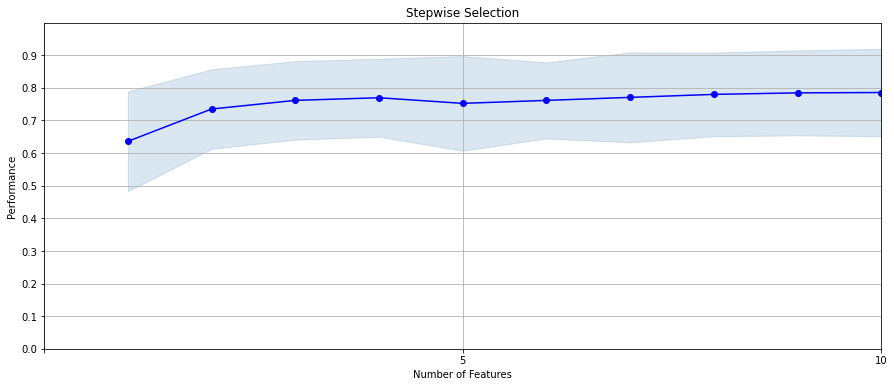

In [34]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs.get_metric_dict(),kind='std_dev', figsize=(15, 6))
plt.xticks(np.arange(0, len(X.columns), step=5))
plt.yticks(np.arange(0,1,step=.1))
plt.ylim([0., 1])
plt.xlim(0,num_wrapper)
plt.title('Stepwise Selection')
plt.grid()
plt.savefig('FS_fdr.png')
plt.show()

In [21]:
vars_FS = pd.DataFrame.from_dict(sfs.get_metric_dict()).T

In [22]:
ordered_vars_FS = vars_FS.copy()
for i in range(len(ordered_vars_FS)):
    ordered_vars_FS.loc[i+1,'add variables in this order'] = int(i+1)
    if i+1 == 1:
        ordered_vars_FS.loc[i+1,'variable name'] = list(ordered_vars_FS.loc[i+1,'feature_names'])[0]
    else:
        ordered_vars_FS.loc[i+1,'variable name'] = set(ordered_vars_FS.loc[i+1,'feature_names']) - set(ordered_vars_FS.loc[i,'feature_names'])

In [23]:
ordered_vars_FS

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err,add variables in this order,variable name
1,"(0,)","[0.4367816091954023, 0.6091954022988506, 0.770...",0.636127,"(card_zip3_total_7,)",0.113571,0.152913,0.050971,1.0,card_zip3_total_7
2,"(0, 401)","[0.7701149425287356, 0.7471264367816092, 0.793...",0.735138,"(card_zip3_total_7, card_state_max_60)",0.090541,0.121906,0.040635,2.0,card_state_max_60
3,"(0, 105, 401)","[0.8505747126436781, 0.7586206896551724, 0.758...",0.761668,"(card_zip3_total_7, card_state_max_14, card_st...",0.089367,0.120325,0.040108,3.0,card_state_max_14
4,"(0, 33, 105, 401)","[0.8620689655172413, 0.7241379310344828, 0.781...",0.769741,"(card_zip3_total_7, card_merch_total_30, card_...",0.088808,0.119572,0.039857,4.0,card_merch_total_30
5,"(0, 33, 105, 401, 506)","[0.8390804597701149, 0.7816091954022989, 0.793...",0.752513,"(card_zip3_total_7, card_merch_total_30, card_...",0.107853,0.145214,0.048405,5.0,zip3_total_0
6,"(0, 33, 105, 401, 446, 506)","[0.8275862068965517, 0.7816091954022989, 0.758...",0.761601,"(card_zip3_total_7, card_merch_total_30, card_...",0.086597,0.116596,0.038865,6.0,state_risk_variability_med_14
7,"(0, 33, 105, 401, 446, 506, 592)","[0.8735632183908046, 0.7816091954022989, 0.827...",0.770863,"(card_zip3_total_7, card_merch_total_30, card_...",0.102462,0.137956,0.045985,7.0,Merchnum_desc_Zip_avg_14
8,"(0, 33, 105, 362, 401, 446, 506, 592)","[0.8620689655172413, 0.7586206896551724, 0.827...",0.780045,"(card_zip3_total_7, card_merch_total_30, card_...",0.095254,0.128252,0.042751,8.0,state_zip_max_1
9,"(0, 32, 33, 105, 362, 401, 446, 506, 592)","[0.8620689655172413, 0.7586206896551724, 0.827...",0.784643,"(card_zip3_total_7, Card_Merchnum_State_total_...",0.096753,0.13027,0.043423,9.0,Card_Merchnum_State_total_30
10,"(0, 32, 33, 105, 261, 362, 401, 446, 506, 592)","[0.8390804597701149, 0.7586206896551724, 0.885...",0.785752,"(card_zip3_total_7, Card_Merchnum_State_total_...",0.099516,0.13399,0.044663,10.0,merch_state_avg_0


In [24]:
ordered_vars_FS.to_csv('VarsFS.csv', index=False)

In [25]:
vars_keep = ordered_vars_FS['variable name']
vars_keep_list = ordered_vars_FS['variable name'].tolist()
vars_keep.to_csv('final_vars_list.csv',index=False)
vars_keep

1                 card_zip3_total_7
2                 card_state_max_60
3                 card_state_max_14
4               card_merch_total_30
5                      zip3_total_0
6     state_risk_variability_med_14
7          Merchnum_desc_Zip_avg_14
8                   state_zip_max_1
9      Card_Merchnum_State_total_30
10                merch_state_avg_0
Name: variable name, dtype: object

In [26]:
filter_score.set_index('variable',drop=True,inplace=True)
filter_score = filter_score.iloc[1:,:]
filter_score.head()

,filter score
variable,
card_zip3_total_7,0.696009
card_zip3_total_3,0.688061
card_zip_total_7,0.684517
card_zip3_total_14,0.681898
Card_Merchnum_State_total_7,0.681654


In [27]:
vars_keep_sorted = pd.DataFrame(vars_keep_list)
vars_keep_sorted.columns=['variable']
vars_keep_sorted.set_index('variable',drop=True,inplace=True)
vars_keep_sorted.head()

""
variable
card_zip3_total_7
card_state_max_60
card_state_max_14
card_merch_total_30
zip3_total_0


In [28]:
vars_keep_sorted = pd.concat([vars_keep_sorted,filter_score],axis=1,join='inner')
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted.reset_index(inplace=True)
vars_keep_sorted['index'] = vars_keep_sorted['index'] + 1
vars_keep_sorted.rename(columns={'index':'wrapper order'},inplace=True)
vars_keep_sorted.to_csv('vars_keep_sorted.csv',index=False)
vars_keep_sorted.head()

,wrapper order,variable,filter score
0,1,card_zip3_total_7,0.696009
1,2,card_state_max_60,0.561104
2,3,card_state_max_14,0.630540
3,4,card_merch_total_30,0.659999
4,5,zip3_total_0,0.537667


In [29]:
vars_keep_list.append(index_name)
vars_keep_list.append(y_name)
vars_keep_list

['card_zip3_total_7',
 'card_state_max_60',
 'card_state_max_14',
 'card_merch_total_30',
 'zip3_total_0',
 'state_risk_variability_med_14',
 'Merchnum_desc_Zip_avg_14',
 'state_zip_max_1',
 'Card_Merchnum_State_total_30',
 'merch_state_avg_0',
 'Recnum',
 'Fraud']

In [30]:
df = pd.read_csv(file_name)
df_keep = df.filter(vars_keep_list, axis=1)
print(df_keep.shape)

(96397, 12)


In [31]:
df_keep.to_csv('vars_final.csv',index=False)

In [32]:
print('time to here:', dt.datetime.now() - start_time)

time to here: 0:48:32.094574


In [33]:
# this is just an empty space cell to makee it easier to scroll down to the bottom while the warnings are printing



































#